# Airbnb纽约房源数据分析及可视化

### 小组： 零号特工
### 组长： 
- ### 16200209 石佳朋
### 成员： 
- ### 15200220 李晗 
- ### 21200422 李骥 
- ### 09200516 徐航宇

## 1 项目背景

自2008年以来，Airbnb使游客出行和房东出租更方便，提出更多个性化的体验世界的方式。Airbnb在全世界191个国家分布有300万个房源，被时代周刊称为“住房中的EBay”。该网站提供了出租房源的具体信息，包括房东信息、地理信息、价格、评论数量等。通过对这些信息的统计分析，我们可以更好地了解不同地区的房屋出租情况，并理解用户租房的关注点。我们将利用Python对出租房源信息进行统计分析，并将统计结果进行可视化。通过上述统计分析，一方面，我们可以为用户提供更好的一般化租房方案；另一方面，我们也可以为房东提供房屋出租的具体情况，并给出合理化出租建议。考虑到出租房源的数据量，我们选择纽约市进行上述分析，后续我们会把模型扩展到其他的地区。
<img src="website.png" width="900px" align="left"></img>

## 2 技术路线

<img src="plan.png" width="900px" align="left"></img>

## 3 成员分工

<img src="division.png" width="900px" align="left"></img>

## 4 数据分析

### 4.1 数据收集

我们主要通过爬虫和抓包收集Airbnb的数据。

**方法一：在Airbnb官网进行网络爬虫**

导入相关包。

In [1]:
import requests
from lxml import html
import csv
import pandas as pd
import numpy as np

从[Airbnb官网](https://www.airbnb.cn)进行爬虫，并将数据保存到本地**out.csv**文件中。

In [2]:
etree = html.etree
url = 'https://www.airbnb.cn/s/newyork/homes?query=newyork&items_offset='

# 反扒头
dict = {
    "User-Agent": "Mozilla/4.0 (compatible; MSIE 7.0; Windows NT 6.0; Acoo Browser;SLCC1; .NET CLR 2.0.50727; Media Center PC 5.0; .NET CLR 3.0.04506)"
}

total_name = []
total_price = []
total_simpleDes = []
for w in range(1, 2): #因每次的搜索结果顺序不同，此处可以控制爬取次数来实现较大数据量的爬取，此处为了方便演示，循环次数仅为1
    for i in range(0, 14): #每次一共只加载15页
        urlnum = i * 20
        link = url + str(urlnum)
        # print(link)
        strr = requests.get(link, headers=dict)
        strr.encoding = "utf-8"
        # with open("page.html","w",encoding="utf-8") as f:
        #     f.write(strr.text)
        html = etree.HTML(strr.text) #构建解析对象
        # name = tree.xpath("//div[@class='_qhtkbey']/text()")  # 房源名
        if i == 0:
            divs = html.xpath("/html/body/div[3]/div/main/div/div/div/div[3]/div/div/section/div/div/div/div[2]/div[2]/div/div/div/div")
            mm = "/html/body/div[3]/div/main/div/div/div/div[3]/div/div/section/div/div/div/div[2]/div[2]/div/div/div/div"
        else:
            divs = html.xpath("/html/body/div[3]/div/main/div/div/div/div[3]/div/div/section/div/div/div/div/div[2]/div/div/div/div")
            mm = "/html/body/div[3]/div/main/div/div/div/div[3]/div/div/section/div/div/div/div/div[2]/div/div/div/div"
        # .//div[@class='shop-info text-overflow-line']/text()
        for div in divs:
            name = div.xpath(".//div/div/div/div/div/div/div/div[2]/div/div/a/div[1]/div[2]/div/div[@class='_qrfr9x5']/text()")  # 房源名
            price = div.xpath(".//div/div/div/div/div/div/div/div[2]/div/div/a/div[3]/div[1]/div[1]/div/span[2]/text()")
            simpleDes = div.xpath(".//div/div/div/div/div/div/div/div[2]/div/div/a/div[1]/div[1]/div/div/span/span/text()")

            tmpname = list(name)
            tmpprice = list(price)
            tmpsimpleDes = list(simpleDes)
            
            for key in range(len(tmpname)):
                if tmpname[key] not in total_name:
                    total_name.append(tmpname[key])
                    total_price.append(tmpprice[key])
                    total_simpleDes.append(tmpsimpleDes[key])

#print(total_price)
#print(total_name)
#print(total_simpleDes)
#print(len(total_name))
#print(len(total_price))
#print(len(total_simpleDes))

#把爬取信息导出为out.csv
df = pd.DataFrame(list(zip(total_name,total_price,total_simpleDes)),columns=['名称','价格','介绍'])
#print(df)
df.to_csv('out.csv',encoding="utf_8_sig",index=False) #直接用utf-8 WPS打开会乱码

对爬虫得到的数据集进行简单展示。

In [3]:
#读入数据集，检查数据内容
airbnb=pd.read_csv("out.csv")
airbnb.head(10)

,名称,价格,介绍
0,@ Brooklyn Birds Nest Peaceful ，客房,￥400,独立房间
1,曼谷装饰艺术客房，靠近地铁和工业城,￥517,1室1.5卫1床
2,公园斜坡温馨舒适的家！无线网络！,￥862,独立房间
3,历史悠久的布鲁克林令人惊叹的主卧,￥662,1室1卫1床
4,日落公园区私人客房,￥407,独立房间
5,在历史悠久的维多利亚式住宅中轻松休息,￥517,独立房间
6,时尚独立房间，距离地铁与工业城仅几步之遥,￥448,1室3卫1床
7,棕石区经典优雅之家，靠近地铁,￥414,独立房间
8,日落公园区附近的独立房间,￥407,1室1卫1床
9,地铁附近布朗斯通的独立秋季客房,￥504,独立房间


**方法二：从Inside Airbnb: Get the Data网站抓包获得需要的数据**

打开[Inside Airbnb网站](http://insideairbnb.com/)查找纽约的数据，在下图所示网页上打开开发者工具，搜索“csv”，即可查询到如下两个数据包，它们携带了我们需要的数据。
<img src="getdata.png" width="900px" align="left"></img>

综合比较两种方式收集到的数据，考虑到数据量和特征完整度等因素，我们采用第二种方式收集到的数据，即抓包得到的数据，进行后续统计分析。

### 4.2 数据清洗

导入相关包。

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
%config InlineBackend.figure_format = "retina"

加载数据集，并显示其大小。

In [5]:
airbnb=pd.read_csv('./NYC 2022.csv')
airbnb.shape

(41533, 18)

显示数据集中数据的特征及其类型。

In [6]:
airbnb.dtypes

id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
number_of_reviews_ltm               int64
license                            object
dtype: object

考虑到可能存在重复的房源信息，我们首先删除**重复**的数据元组。

In [7]:
airbnb.duplicated().sum()
airbnb.drop_duplicates(inplace=True)

检测每一列中的空值。

In [8]:
airbnb.isnull().sum()

id                                    0
name                                 13
host_id                               0
host_name                             5
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                        9393
reviews_per_month                  9393
calculated_host_listings_count        0
availability_365                      0
number_of_reviews_ltm                 0
license                           41532
dtype: int64

从我们的数据集的性质来看，特征"id"，"host_name"和"license"与我们的数据分析无关，而特征"last_review"和"review_per_month"需要一定的处理。具体来讲，"last_review"是日期，如果该列表没有评论，那么日期就不会存在。在我们的分析中，这一列是不重要的，可以将其删除。对于"review_per_month"列，我们可以将缺失值设置为0。因此，让我们继续删除不重要的列和处理缺失数据。

我们删除不重要的列（特征），并简单展示数据。

In [9]:
airbnb.drop(['license'], axis=1, inplace=True)
airbnb.drop(['id','host_name','last_review'], axis=1, inplace=True)
airbnb.head(5)

,name,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,"Spacious Brooklyn Duplex, Patio + Garden",7378,Brooklyn,Sunset Park,40.66265,-73.99454,Entire home/apt,275,21,3,0.03,1,267,1
1,Cozy Clean Guest Room - Family Apt,7490,Manhattan,Upper West Side,40.80380,-73.96751,Private room,75,2,118,0.73,1,0,0
2,BlissArtsSpace!,7356,Brooklyn,Bedford-Stuyvesant,40.68535,-73.95512,Private room,60,30,50,0.30,2,322,0
3,Large Furnished Room Near B'way,8967,Manhattan,Midtown,40.76457,-73.98317,Private room,68,2,559,3.38,1,79,50
4,Skylit Midtown Castle,2845,Manhattan,Midtown,40.75356,-73.98559,Entire home/apt,175,30,49,0.31,3,365,1


我们将"reviews_per_month"中的所有NaN值替换为0，并检查结果。

In [10]:
airbnb.fillna({'reviews_per_month':0}, inplace=True)
airbnb.reviews_per_month.isnull().sum()

0

下面，我们将经过上述处理后特征仍不完整的数据删除，即将包含特征为NAN的数据点删除。

In [11]:
airbnb.isnull().sum()
airbnb.dropna(how='any',inplace=True)
airbnb.info() #.info() function is used to get a concise summary of the dataframe

<class 'pandas.core.frame.DataFrame'>
Int64Index: 41520 entries, 0 to 41532
Data columns (total 14 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   name                            41520 non-null  object 
 1   host_id                         41520 non-null  int64  
 2   neighbourhood_group             41520 non-null  object 
 3   neighbourhood                   41520 non-null  object 
 4   latitude                        41520 non-null  float64
 5   longitude                       41520 non-null  float64
 6   room_type                       41520 non-null  object 
 7   price                           41520 non-null  int64  
 8   minimum_nights                  41520 non-null  int64  
 9   number_of_reviews               41520 non-null  int64  
 10  reviews_per_month               41520 non-null  float64
 11  calculated_host_listings_count  41520 non-null  int64  
 12  availability_365                

下面我们对价格变量绘制箱线图，观察到价格"price"受异常数据、极端数据影响。

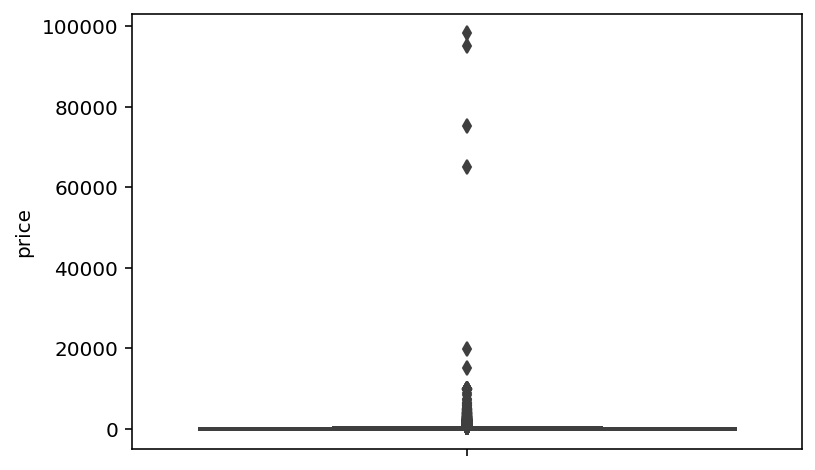

In [12]:
sns.boxplot(y=airbnb["price"])

可以观察到，去除极端数据($price\gt 500$)后分析，房价在($100,200$)左右分布较为集中。

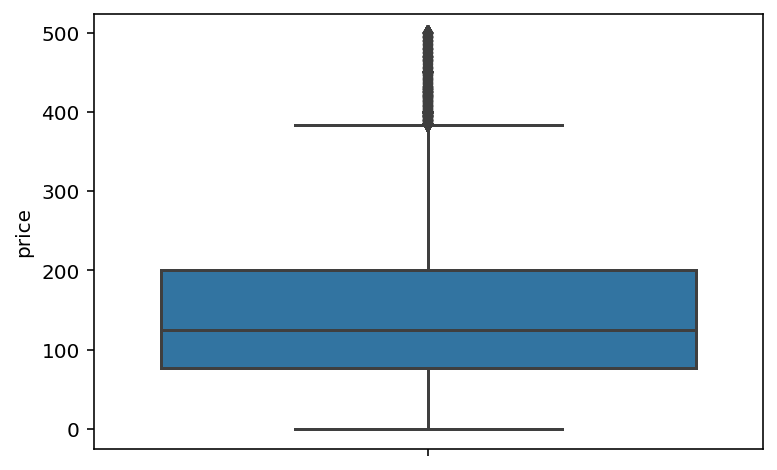

In [13]:
airbnb = airbnb[airbnb.price < 500]
sns.boxplot(y=airbnb["price"])

至此数据清洗完成，我们对所有的特征名进行展示。

In [14]:
airbnb.columns

Index(['name', 'host_id', 'neighbourhood_group', 'neighbourhood', 'latitude',
       'longitude', 'room_type', 'price', 'minimum_nights',
       'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365',
       'number_of_reviews_ltm'],
      dtype='object')

### 4.3 数据呈现

完成数据清洗后，我们对数据进行了简单的展示。
呈现的数据表如下图所示。

In [15]:
airbnb.head(5)

,name,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,"Spacious Brooklyn Duplex, Patio + Garden",7378,Brooklyn,Sunset Park,40.66265,-73.99454,Entire home/apt,275,21,3,0.03,1,267,1
1,Cozy Clean Guest Room - Family Apt,7490,Manhattan,Upper West Side,40.80380,-73.96751,Private room,75,2,118,0.73,1,0,0
2,BlissArtsSpace!,7356,Brooklyn,Bedford-Stuyvesant,40.68535,-73.95512,Private room,60,30,50,0.30,2,322,0
3,Large Furnished Room Near B'way,8967,Manhattan,Midtown,40.76457,-73.98317,Private room,68,2,559,3.38,1,79,50
4,Skylit Midtown Castle,2845,Manhattan,Midtown,40.75356,-73.98559,Entire home/apt,175,30,49,0.31,3,365,1


下面，我们将所有的数据点按照经纬度的值投影到地图上，得到了一个直观的热图。我们还根据房源的价格为地图上的每个点添加了不同范围的彩色编码。

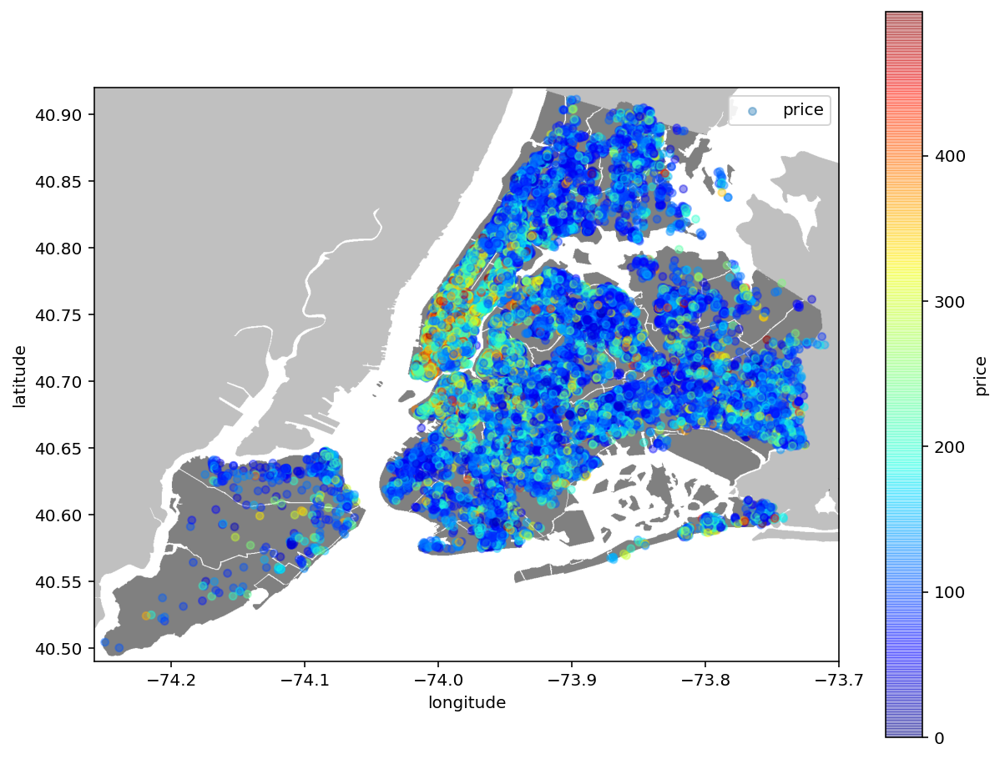

In [16]:
import urllib
#initializing the figure size
plt.figure(figsize=(10,8))
#loading the png NYC image found on Google and saving to my local folder along with the project
#i=urllib.request.urlopen('https://upload.wikimedia.org/wikipedia/commons/e/ec/Neighbourhoods_New_York_City_Map.PNG')
nyc_img=plt.imread('Neighbourhoods_New_York_City_Map.png')
#scaling the image based on the latitude and longitude max and mins for proper output
plt.imshow(nyc_img,zorder=0,extent=[-74.258, -73.7, 40.49,40.92])
ax=plt.gca()
#creating a sub-dataframe with no extreme values / less than 500
sub_6=airbnb[airbnb.price < 500]
#using scatterplot again
sub_6.plot(kind='scatter', x='longitude', y='latitude', label='price', c='price', ax=ax, 
           cmap=plt.get_cmap('jet'), colorbar=True, alpha=0.4, zorder=5)

plt.legend()
plt.show()

### 4.4 房源计数统计

按**行政区**分类统计：

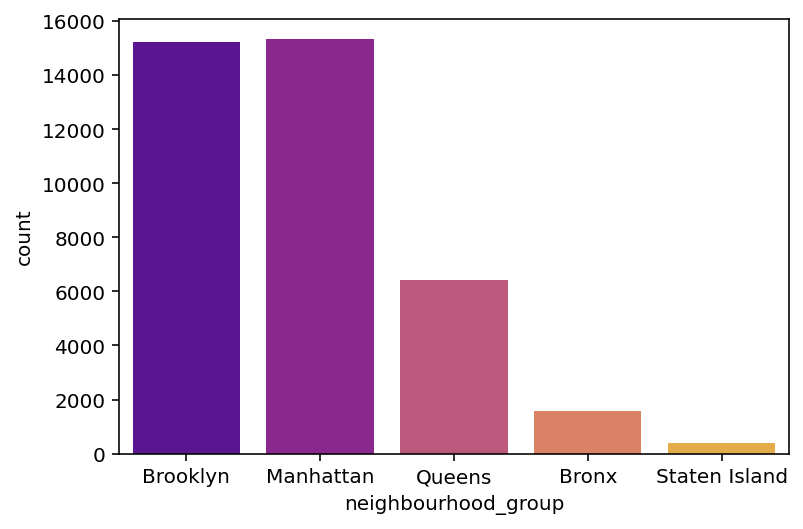

In [17]:
#Restaurants delivering Online or not
sns.countplot(airbnb['neighbourhood_group'], palette="plasma")
plt.show()

#data = [35, 21, 29, 39, 11]
#colors = sns.color_palette('pastel')
#plt.pie(data, colors = colors)
#plt.show()

#fig = plt.gcf()
#fig.set_size_inches(10,10)
#plt.title('Restaurants delivering online or Not')

我们观察到，曼哈顿地区房源数量最多，布鲁克林次之，斯塔滕岛的房源数量最少。

按**房源类型**分类统计：

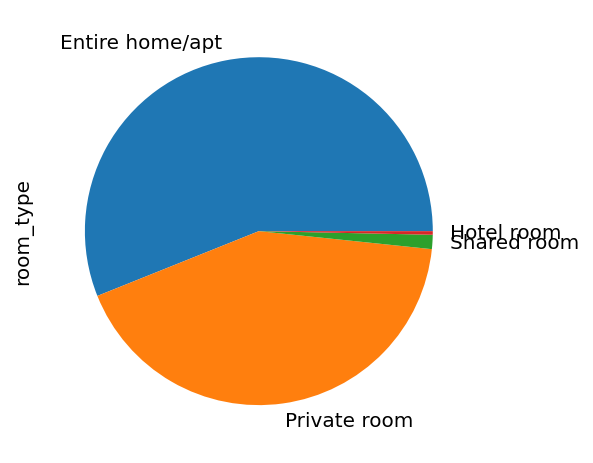

<Figure size 720x720 with 0 Axes>

In [18]:
airbnb['room_type'].value_counts().plot.pie()
plt.figure(figsize=[10,10])
plt.show()

我们观察到，entire room/apt和private room类型的房源数量最多，hotel room和shared room类型的房源很少。

按**房东**分类统计并排名：

Text(0.5, 1.0, 'Host Rank')

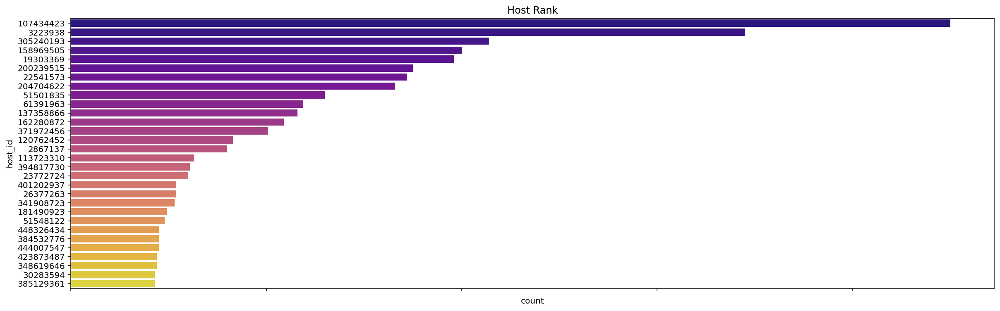

In [19]:
dat = airbnb['host_id']
ax = sns.countplot(y=dat, order = dat.value_counts().nlargest(30).index,palette="plasma",orient='h')   
ax.set_xticklabels(ax.get_xticklabels(),rotation = 45)
fig = plt.gcf()
fig.set_size_inches(20,6)

plt.title('Host Rank')


图中给出了房源数量排名前30的房东。可以看出，排在前两名的ID为107434423和3223938的房东相比其他房东占据了绝对的领先地位。

不同行政区下不同社区的房源计数统计：

In [20]:
import pyecharts.options as opts
from pyecharts.charts import Pie
from collections import Counter

In [21]:
xi = list(airbnb['neighbourhood_group'])
idictt = Counter(xi)
inner_data_pair = [list(z) for z in zip(idictt.keys(), idictt.values())]

xo = list(airbnb['neighbourhood'])
odictt = Counter(xo)
outer_data_pair = [list(z) for z in zip(odictt.keys(), odictt.values())]
(
    Pie()
    .add(
        series_name="neighbourhood_group",
        data_pair=inner_data_pair,
        radius=["20%", "40%"],
       # label_opts=opts.LabelOpts(position="inner"),
    )
    .add(
        series_name="neighbourhood",
        radius=["62%", "100%"],
        data_pair=outer_data_pair,
        label_opts=opts.LabelOpts(is_show=False),
    )
    .set_global_opts(
        legend_opts=opts.LegendOpts(is_show=False),
        #tooltip_opts=opts.TooltipOpts(is_show=False),
    )
    .set_series_opts(
        is_show=False
    )
    .render_notebook()
)

可以看出，布鲁克林和曼哈顿占据了房源市场的绝大部分，其下属的每个社区都占有了较大的市场份额；剩下的行政区占有了市场份额较少，但它们下属的社区很多，分布相对分散，在双环图中体现为外环的颜色交错复杂。

### 4.5 价格分布

不同社区的价格分布。

Text(0.5, 1.0, 'Density and distribution of prices for each neighberhood_group')

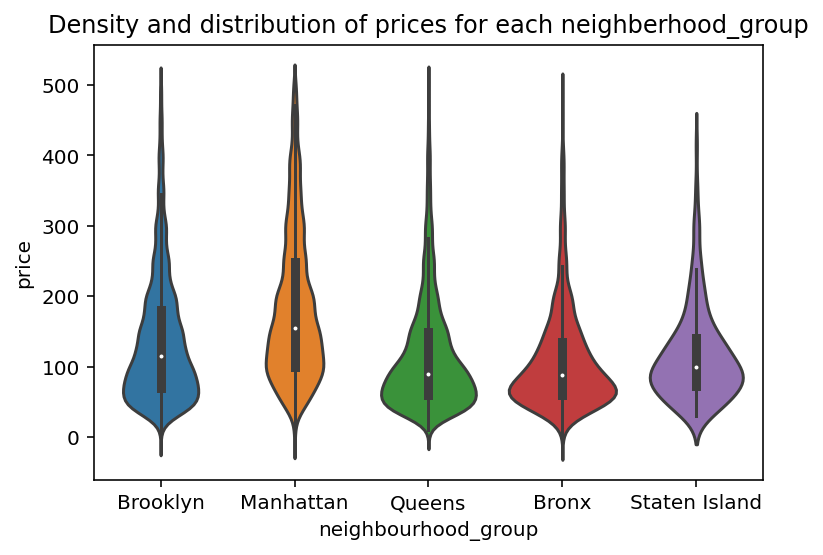

In [22]:
sub=airbnb[airbnb.price < 500]
#使用小提琴图展现价格的分布情况
viz_2=sns.violinplot(data=sub, x='neighbourhood_group', y='price')
viz_2.set_title('Density and distribution of prices for each neighberhood_group')

我们使用小提琴图展现价格的分布情况。可以看出不同社区的价格的集中制和扁平度略有不同：曼哈顿分布最分散，布朗克斯分布最集中。

### 4.6 多特征相关性联合分析

矩阵散点图。

<Figure size 2160x2160 with 0 Axes>

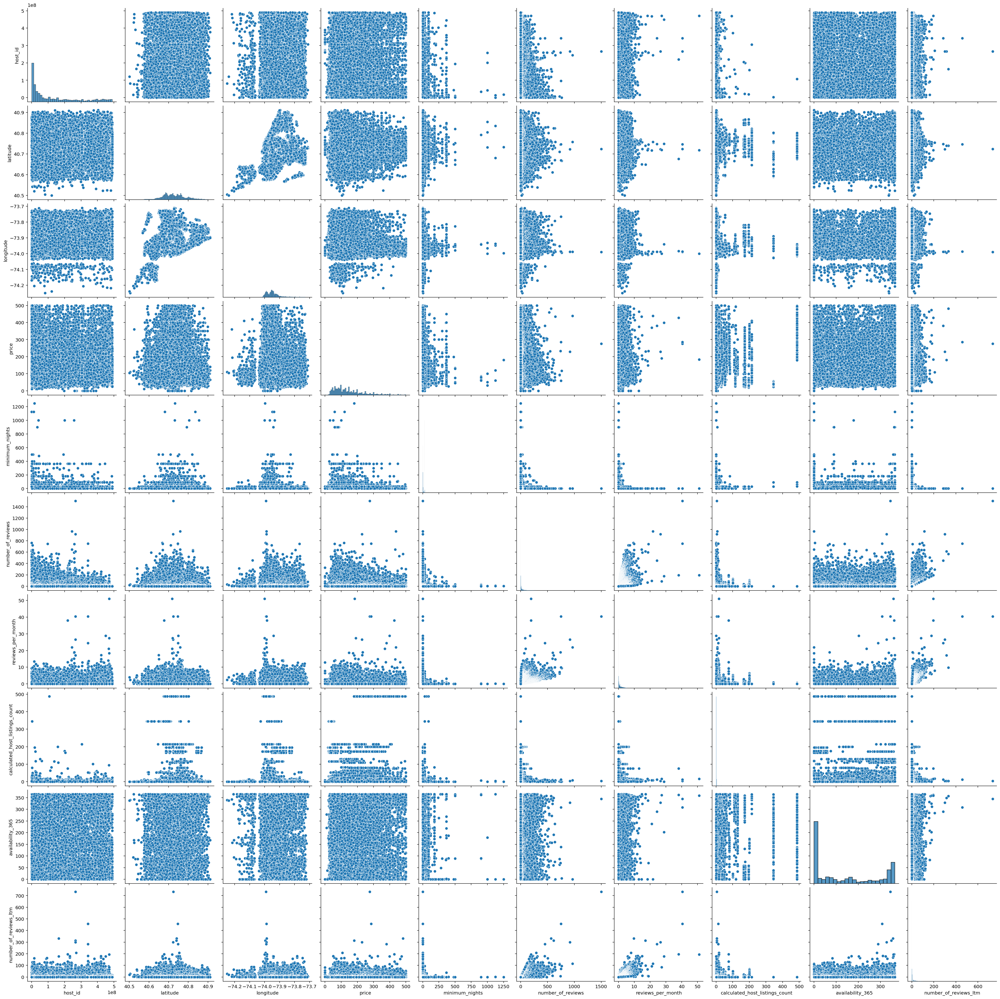

In [23]:
plt.figure(figsize=(30, 30))
sns.pairplot(airbnb, height=3, diag_kind="hist")

在计算皮尔逊相关系数之前,我们绘制矩阵散点图来观察两组变量之间是否有线性关系。

联合分布相关性热图

Index(['name', 'host_id', 'neighbourhood_group', 'neighbourhood', 'latitude',
       'longitude', 'room_type', 'price', 'minimum_nights',
       'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365',
       'number_of_reviews_ltm'],
      dtype='object')

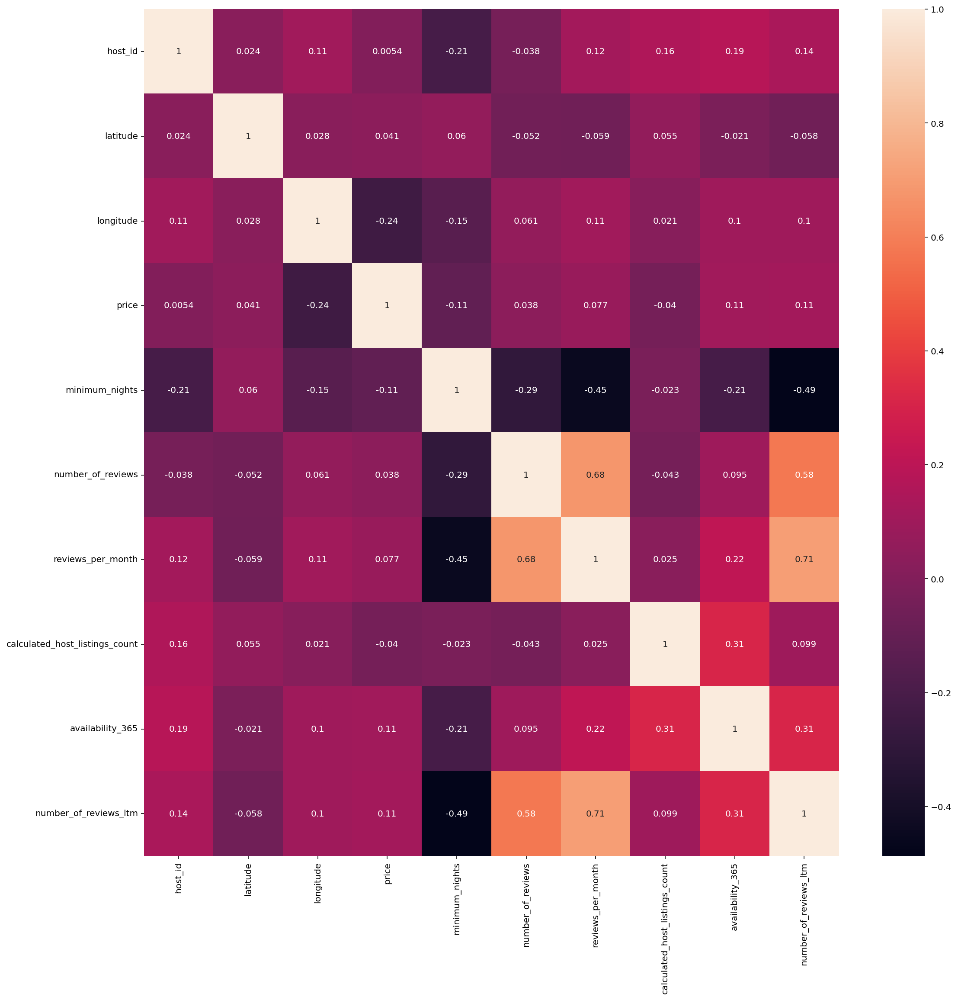

In [24]:
corr = airbnb.corr(method='kendall')
plt.figure(figsize=(18,18))
sns.heatmap(corr, annot=True)
#plt.savefig("heat.svg")
airbnb.columns

### 4.7 词频分析

词云展示。

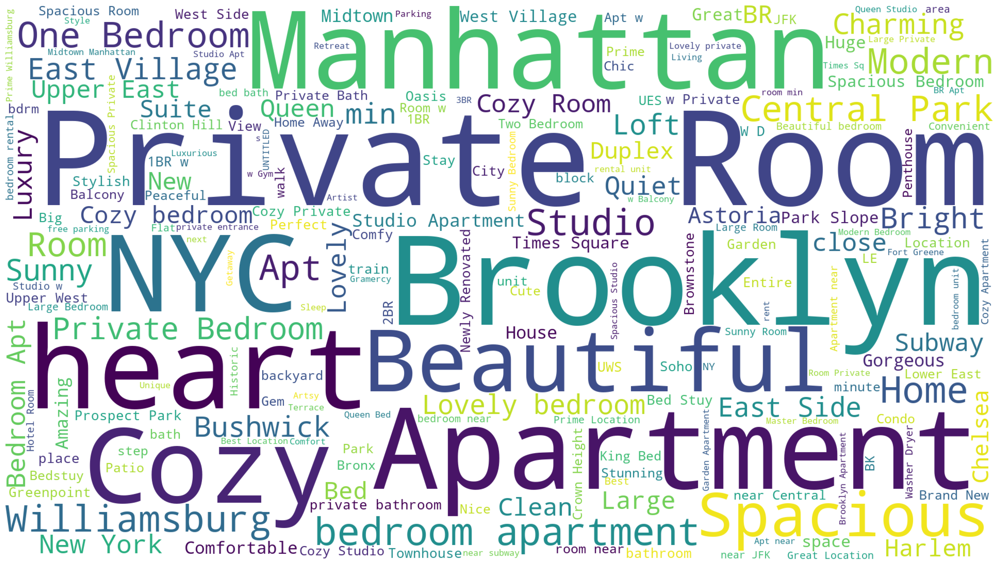

In [25]:
from wordcloud import WordCloud
from matplotlib import colors
plt.subplots(figsize=(25,15))
# color_list = ['#2c177e','#ff0000']
# colormap = colors.ListedColormap(color_list)
wordcloud = WordCloud(
        background_color='white',
        width=1920,
        height=1080,
      #  colormap=colormap
).generate(" ".join(str(i) for i in airbnb.name))
plt.imshow(wordcloud)
plt.axis('off')
plt.savefig('cloud.png')
plt.show()


我们对房源名称进行了词频统计并绘制了词云。可以看出，“private room”词频最高，体现了该种房源类型在市场中占有优势，在词频较高的单词中，主要有三大类：描述地理位置的，如“Brooklyn”，“Manhattan”，描述房屋种类的，如“apartment”，描述居住环境的，如“heart”，“beautiful”，“cozy”。

## 5 预测与扩展

此部分代码我们放在同目录下**predict.py**文件中。

## 感谢阅读！